# 爬取百度图片各种狗狗的图片，使用caffe训练模型分类

### tag:
______

selenium
PhantomJS
sklearn
BeautifulSoup
caffe

#### caffe的安装等配置请自行查阅，可以先只编译一个only cpu的
#### git代码地址：https://github.com/bbfamily/DogJudge
#### 如有任何问题加微信联系微信号：aaaabbbuu

## 1. 代理获取
    爬一些提供免费代理的网站，获取到的代理要根据速度要求等check，
    可扩展爬取的网站，这里只简单爬了两个，代理质量一般，也可以用
    Tor不过好像也不怎么好使了

In [1]:
from SpiderProxy import SpiderProxy
import ZLog
ZLog.init_logging()

In [5]:
pxy = SpiderProxy()
pxy.spider_proxy360()
pxy.spider_xicidaili()
pxy.check_proxy()
pxy.save_csv()

211.151.48.60:8080 check ok
139.196.108.68:80 check ok
110.178.198.55:8888 check ok
106.75.128.90:80 check ok
60.194.100.51:80 check ok
117.57.188.176:81 check ok
45.32.19.10:3128 check ok
110.181.181.164:8888 check ok
39.87.237.90:81 check ok
111.206.81.248:80 check ok
47.89.53.92:3128 check ok
112.87.106.217:81 check ok
218.89.69.211:8088 check ok
139.59.180.41:8080 check ok
124.133.230.254:80 check ok
128.199.186.153:8080 check ok
192.249.72.148:3128 check ok
112.112.70.116:80 check ok
128.199.178.73:8080 check ok
178.32.153.219:80 check ok
79.141.70.78:3128 check ok
119.6.136.122:80 check ok
46.219.78.221:8081 check ok
proxy_list len=23


## 2. 狗狗分类数据获取

In [2]:
import SpiderBdImg

爬虫可设置项：
1. g_enable_show:是否使用有界面浏览器还是使用PHANTOMJS
2. g_enable_proxy:浏览器的进程是否启用代理，默认不需要，下载原图一定是使用代理没有开关
3. g_enable_debug:单进程，单线程调试模式可以debug断点
4. g_enable_stream使用流下载图片
5. K_SCROLL_MOVE_DISTANCE = 200 模拟js window下滑距离，增大提高爬取速度
6. K_SCROLL_SLEEP_TIME = 3 
7. K_COLLECT_PROCESS_CNT = 3 同时启动进程个数

由于使用了线程池控制max线程数，所以就算你提高K_SCROLL_MOVE_DISTANCE，K_SCROLL_SLEEP_TIME也不会有下载速度的提升，
需要修改线程池初始化现在设置了3倍代理数量，具体详看代码：
    with ThreadPoolExecutor(max_workers=len(self.back_proxys) * 3) as executor:


**默认启动google有界面浏览器了，因为代理质量太差，所以就起了三个进程，如果要启动多个进程在乎效率，代理质量够好，要使用PHANTOMJS**

    n_jobs = 3
    if g_enable_debug:
        n_jobs = 1
    parallel = Parallel(
        n_jobs=n_jobs, verbose=0, pre_dispatch='2*n_jobs')

    parallel(delayed(do_spider_parallel)(proxy_df, ind, search_name) for ind, search_name in enumerate(search_list))
    
**使用selenium配合BeautifulSoup，requests爬取图片，达到目标数量或者到所有图片停止
具体请参考SpiderBdImg**

In [3]:
SpiderBdImg.spider_bd_img([u'拉布拉多', u'哈士奇', u'金毛', u'萨摩耶', u'柯基', u'柴犬',
                            u'边境牧羊犬', u'比格', u'德国牧羊犬', u'杜宾', u'泰迪犬', u'博美', u'巴哥', u'牛头梗'],
                            use_cache=True)

makedirs ../gen/baidu/image/金毛
makedirs ../gen/baidu/image/哈士奇
makedirs ../gen/baidu/image/拉布拉多
makedirs ../gen/baidu/image/萨摩耶
makedirs ../gen/baidu/image/柯基
makedirs ../gen/baidu/image/柴犬
makedirs ../gen/baidu/image/边境牧羊犬
makedirs ../gen/baidu/image/比格
makedirs ../gen/baidu/image/德国牧羊犬
makedirs ../gen/baidu/image/杜宾
makedirs ../gen/baidu/image/泰迪犬
makedirs ../gen/baidu/image/博美
makedirs ../gen/baidu/image/巴哥
makedirs ../gen/baidu/image/牛头梗


## 3. 下一步，人工大概扫一下图片，把太过份的删了，不用太仔细，太概扫扫就完事,  这工具其实也是可以自动识别的，先自己扫扫吧

![image](../Snip20160930_2.png)

![image](../Snip20160930_5.png)

## 4. 数据标准化
        
        为caffe的lmdb做准备将图片都转换成jpeg，因为作lmdb使用opencv其它格式有问题
        包括下载下来的gif，png等等找到图片，辨识真实图片类型，命名真实名称后缀，将非jpeg的转化为jpeg
        具体参考ImgStdHelper
        
运行成功后所有图片为jpeg后缀名称

In [11]:
import ImgStdHelper

In [10]:
ImgStdHelper.std_img_from_root_dir('../gen/baidu/image/', 'jpg')

## 5. 开始训练模型及准备

#### 5.1  生成训练集文件

In [45]:
!../sh/DogType.sh

mkdir: ../gen/dog_judge: File exists
Create train.txt...
train.txt Done..


生成如下格式数据，具体参看gen/dog_judge/Train.txt

In [46]:
train_path = '../gen/dog_judge/Train.txt'
print open(train_path).read(400)

哈士奇/001e5dd0f5aa0959503324336f24a5ea.jpeg 1
哈士奇/001eae03d6f282d1e9f4cb52331d3e20.jpeg 1
哈士奇/0047ea48c765323a53a614d0ed93353b.jpeg 1
哈士奇/006e3bd75b2375149dab9d0323b9fc59.jpeg 1
哈士奇/0084e12ec1c15235a78489a0f4703859.jpeg 1
哈士奇/009724727e40158f5b84a50a7aaaa99b.jpeg 1
哈士奇/00a9d66c72bbed2861f632d07a98db8d.jpeg 1
哈士奇/00dabcba4437f77859b1d8ed37c85360.jpeg 1



生成数字类别对应的label文件

In [98]:
import pandas as pd
class_map = pd.DataFrame(np.array([[1, 2, 3, 4, 5, 6], ['哈士奇', '拉布拉多', '博美', '柴犬', '德国牧羊犬', '杜宾']]).T, 
                        columns=['class', 'name'], 
                        index=np.arange(0, 6))
class_map.to_csv('../gen/class_map.csv', columns=class_map.columns, index=True)

#### 5.2 生成val，test集 

**TrainValSplit 将train的数据集每个类别按照n_folds=10即分成十分，val占一分，train占九份，与scikit等分割参数n_folds用法一样
在gen下重新生成训练数据集，测试数据集，交织测试数据集，这里的test与val数据一样不过，test没有分类标注**

    def train_val_split(train_path, n_folds=10):
        if n_folds <= 1:
            raise ValueError('n_folds must > 1')

        with open(train_path, 'r') as f:
            lines = f.readlines()
            class_dict = defaultdict(list)
            for line in lines:
                cs = line[line.rfind(' '):]
                class_dict[cs].append(line)

        train = list()
        val = list()
        for cs in class_dict:
            cs_len = len(class_dict[cs])
            val_cnt = int(cs_len / n_folds)
            val.append(class_dict[cs][:val_cnt])
            train.append(class_dict[cs][val_cnt:])
        val = list(itertools.chain.from_iterable(val))
        train = list(itertools.chain.from_iterable(train))
        test = [t.split(' ')[0] for t in val]

        fn = os.path.dirname(train_path) + '/train_split.txt'
        with open(fn, 'w') as f:
            f.writelines(train)
        fn = os.path.dirname(train_path) + '/val_split.txt'
        with open(fn, 'w') as f:
            f.writelines(val)
        fn = os.path.dirname(train_path) + '/test_split.txt'
        with open(fn, 'w') as f:
            f.writelines(test)

In [55]:
import TrainValSplit

In [56]:
TrainValSplit.train_val_split(train_path, n_folds=10)

In [60]:
train_path = '../gen/dog_judge/train_split.txt'
with open(train_path) as f:
    print 'train set len = {}'.format(len(f.readlines()))
val_path = '../gen/dog_judge/val_split.txt'
with open(val_path) as f:
    print 'val set len = {}'.format(len(f.readlines()))

train set len = 9628
val set len = 1066


#### 5.2 生成图片lmdb数据库

        echo "Begin..."

        ROOTFOLDER=../gen/baidu/image
        OUTPUT=../gen/dog_judge

        rm -rf $OUTPUT/img_train_lmdb
        /Users/Bailey/caffe/build/tools/convert_imageset --shuffle \
        --resize_height=256 --resize_width=256 \
        $ROOTFOLDER $OUTPUT/train_split.txt  $OUTPUT/img_train_lmdb

        rm -rf $OUTPUT/img_val_lmdb
        /Users/Bailey/caffe/build/tools/convert_imageset --shuffle \
        --resize_height=256 --resize_width=256 \
        $ROOTFOLDER $OUTPUT/val_split.txt  $OUTPUT/img_val_lmdb

        echo "Done.."

In [ ]:
!../sh/DogLmdb.sh

有些显示Could not open or find file的是如下这张下载就下载残了的，本来就需要干掉

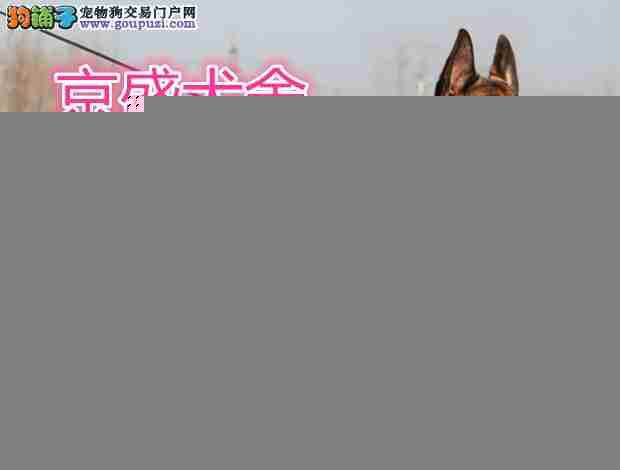

In [69]:
import PIL.Image
PIL.Image.open('../gen/baidu/image/德国牧羊犬/023ee4e18ebfa4a3db8793e275fae47e.jpeg')

#### 5.4 生成去均值mean pb文件
       
**注意需要替换DogMean.sh中caffe的路径文件为你的目录文件MEANBIN=/Users/Bailey/caffe/build/tools/compute_image_mean**

In [72]:
!../sh/DogMean.sh

Begin...
../gen/dog_judge/mean.binaryproto
../gen/dog_judge/mean_val.binaryproto
Done..


#### 5.5 使用bvlc_googlenet的solver.prototxt，train_val.prototxt训练自己的数据

_____


**
根据训练数据及测试数据的量修改solver.prototxt，train_val.prototxt**

**由于测试数据大概1000 －> batch_size=50, test_iter: 20**

**训练数据大概10000 －> test_interval: 1000**

**display: 100 snapshot: 5000(其实snapshot大点没事，反正没次crl ＋ c结束时会生成mode), 如过需要多留几个做对比，可调小**

**可以把test的mirror设置true反正数据不算多**

**修改DogTrain.sh 中CAFEBIN=/Users/Bailey/caffe/build/tools/caffe为你的caffe路径**

**修改solver.prototxt，train_val.prototxt中所有绝对路径为你的路径，没法使用相对路径除非想对caffe路径，那样更麻烦**

### 详情请参考solver.prototxt，train_val.prototxt

之后使用!../sh/DogTrain.sh开始训练数据，由于要打太多日志，就不在ipython中运行了，单独启个窗口来, 生成caffemodel

In [74]:
!open ./

## 6. 使用生成的模型进行分类

    6.1 构造caffe net

In [75]:
import caffe

In [121]:
caffe.set_mode_cpu()

model_def = '../pb/deploy.prototxt'
model_weights = '../gen/dog_judge/dog_judge_train_iter_5000.caffemodel'
model_mean_file = '../gen/dog_judge/mean.binaryproto'

net = caffe.Net(model_def, model_weights, caffe.TEST)  

In [122]:
mean_blob = caffe.proto.caffe_pb2.BlobProto()
mean_blob.ParseFromString(open(model_mean_file, 'rb').read())
mean_npy = caffe.io.blobproto_to_array(mean_blob)
mu = mean_npy.mean(2).mean(2)[0]
print 'mu = {}'.format(mu)
transformer = caffe.io.Transformer({'data': net.blobs['data'].data.shape})
transformer.set_transpose('data', (2,0,1))  
transformer.set_mean('data', mu)           
transformer.set_raw_scale('data', 255)     
transformer.set_channel_swap('data', (2,1,0))  

mu = [ 116.2626216   129.17550814  137.46700908]


In [123]:
for layer_name, blob in net.blobs.iteritems():
    print layer_name + '\t' + str(blob.data.shape)

data	(10, 3, 224, 224)
conv1/7x7_s2	(10, 64, 112, 112)
pool1/3x3_s2	(10, 64, 56, 56)
pool1/norm1	(10, 64, 56, 56)
conv2/3x3_reduce	(10, 64, 56, 56)
conv2/3x3	(10, 192, 56, 56)
conv2/norm2	(10, 192, 56, 56)
pool2/3x3_s2	(10, 192, 28, 28)
pool2/3x3_s2_pool2/3x3_s2_0_split_0	(10, 192, 28, 28)
pool2/3x3_s2_pool2/3x3_s2_0_split_1	(10, 192, 28, 28)
pool2/3x3_s2_pool2/3x3_s2_0_split_2	(10, 192, 28, 28)
pool2/3x3_s2_pool2/3x3_s2_0_split_3	(10, 192, 28, 28)
inception_3a/1x1	(10, 64, 28, 28)
inception_3a/3x3_reduce	(10, 96, 28, 28)
inception_3a/3x3	(10, 128, 28, 28)
inception_3a/5x5_reduce	(10, 16, 28, 28)
inception_3a/5x5	(10, 32, 28, 28)
inception_3a/pool	(10, 192, 28, 28)
inception_3a/pool_proj	(10, 32, 28, 28)
inception_3a/output	(10, 256, 28, 28)
inception_3a/output_inception_3a/output_0_split_0	(10, 256, 28, 28)
inception_3a/output_inception_3a/output_0_split_1	(10, 256, 28, 28)
inception_3a/output_inception_3a/output_0_split_2	(10, 256, 28, 28)
inception_3a/output_inception_3a/output_0_sp

In [124]:
import numpy as np
import matplotlib.pyplot as plt
import glob
%matplotlib inline

plt.rcParams['figure.figsize'] = (10, 10)   

**主角🐶终于要上场了我家拉布拉多阿布，使用阿布的平时生活照片作为测试看看准确率怎么样**

In [99]:
class_map = pd.read_csv('../gen/class_map.csv', index_col=0)
class_map

,class,name
0,1,哈士奇
1,2,拉布拉多
2,3,博美
3,4,柴犬
4,5,德国牧羊犬
5,6,杜宾


In [128]:
predict_dir = '../abu' 
img_list = glob.glob(predict_dir + '/*.jpeg')
len(img_list)

22

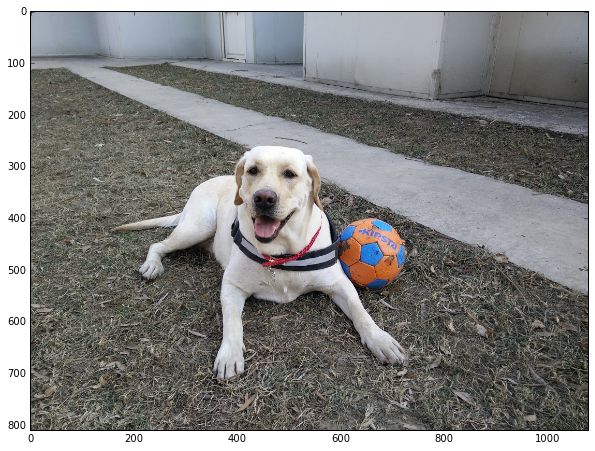

predicted class is: 拉布拉多


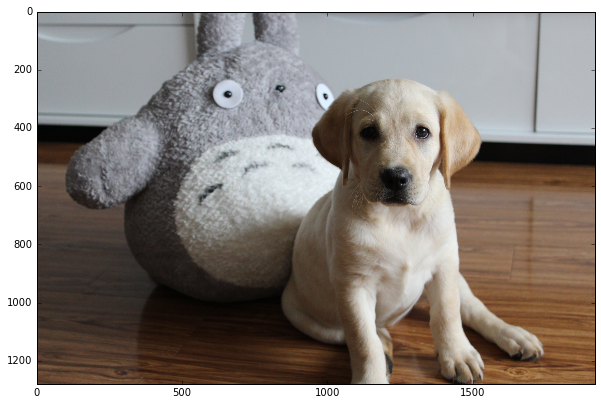

predicted class is: 拉布拉多


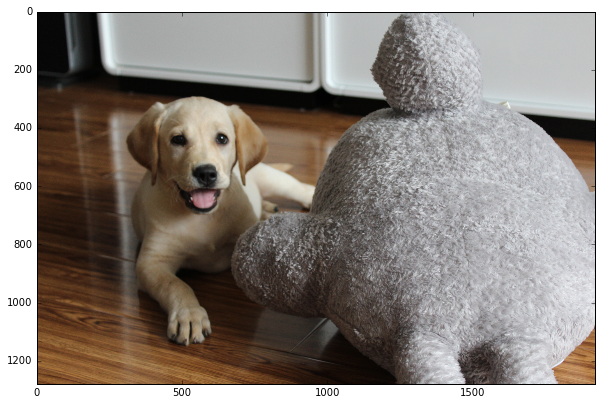

predicted class is: 拉布拉多


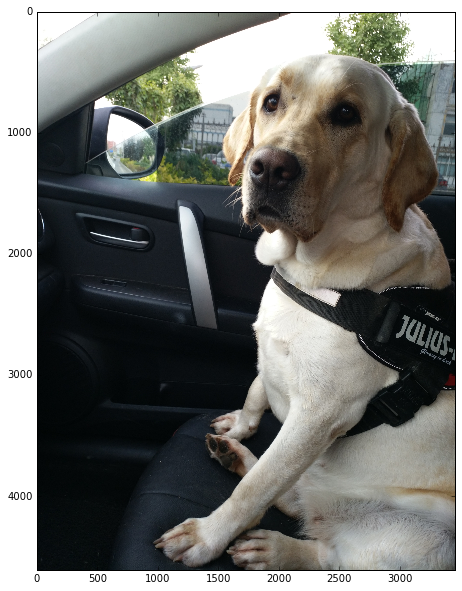

predicted class is: 拉布拉多


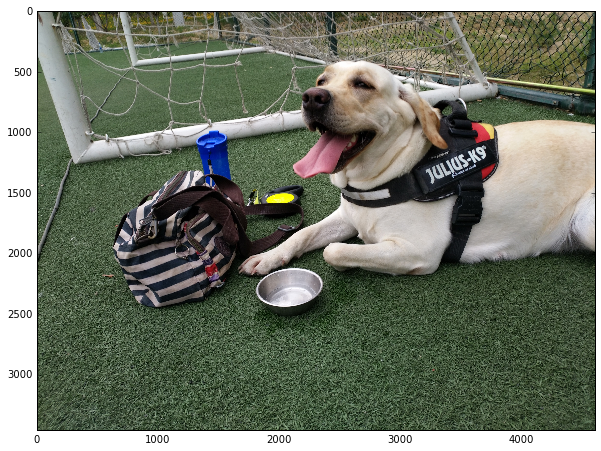

predicted class is: 拉布拉多


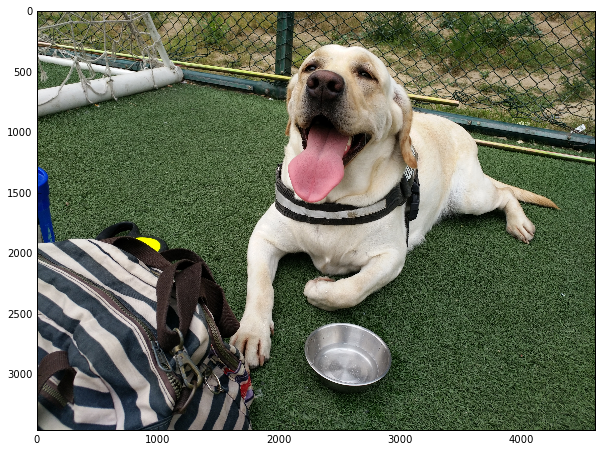

predicted class is: 拉布拉多


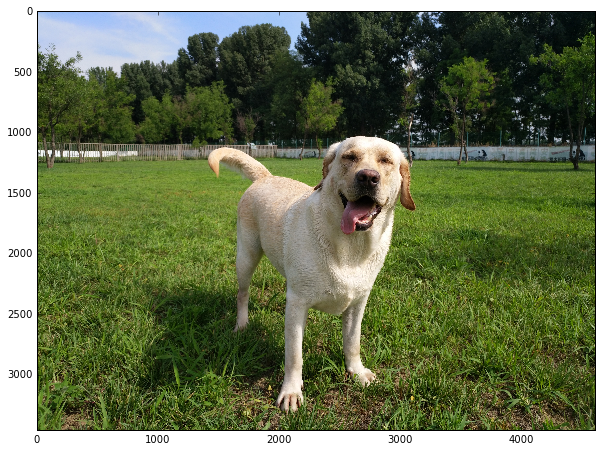

predicted class is: 德国牧羊犬


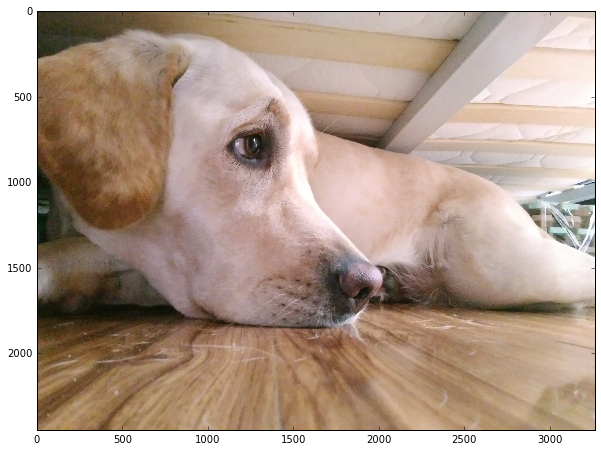

predicted class is: 博美


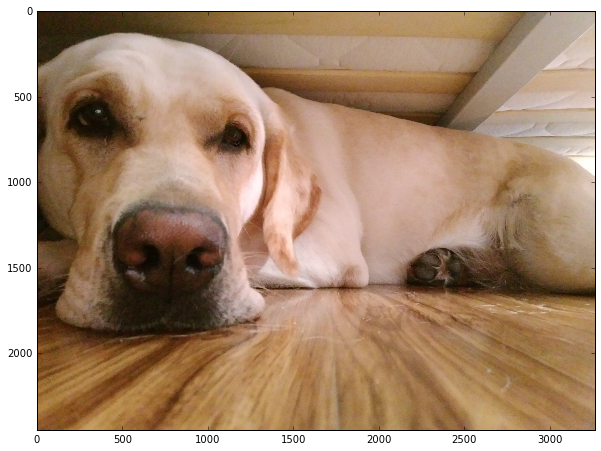

predicted class is: 拉布拉多


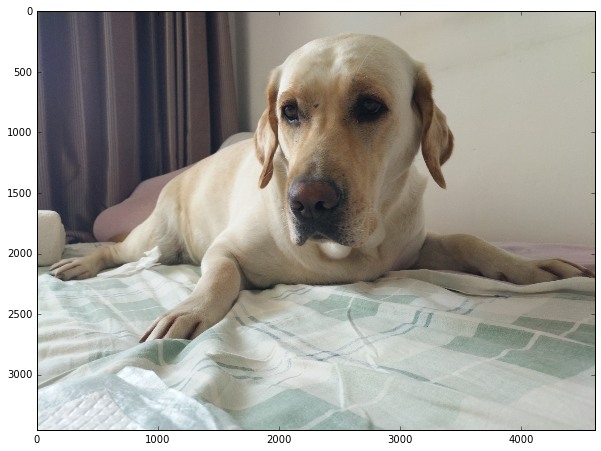

predicted class is: 拉布拉多


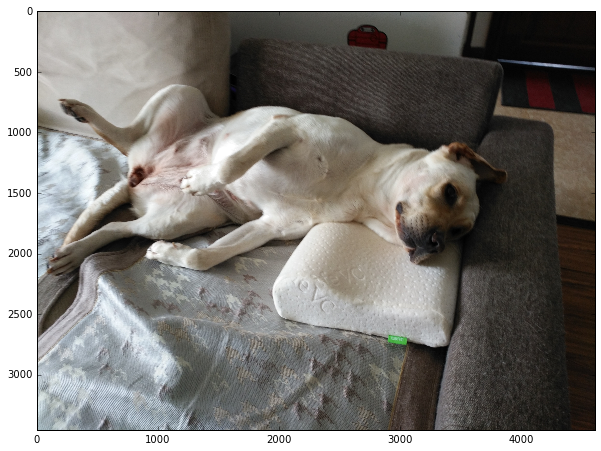

predicted class is: 拉布拉多


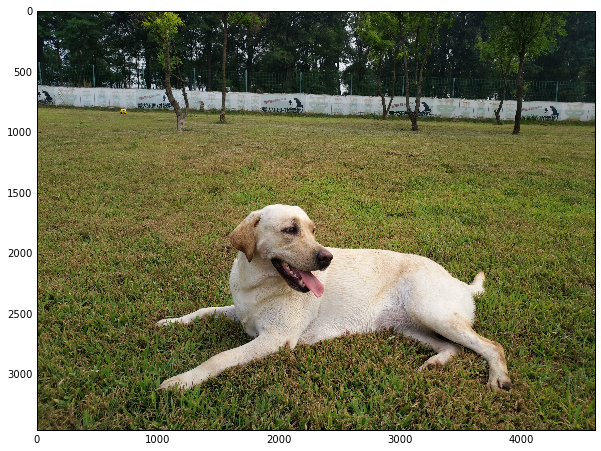

predicted class is: 拉布拉多


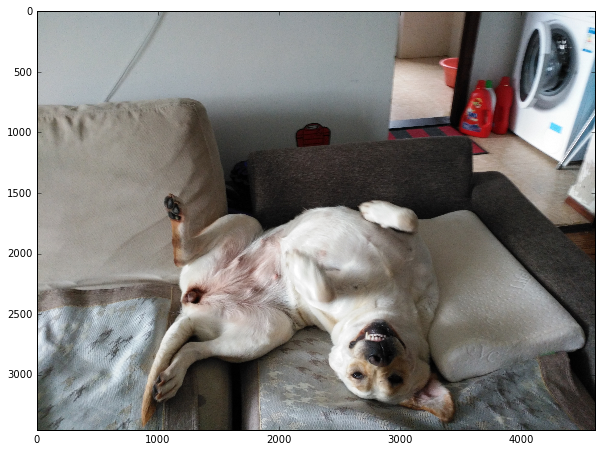

predicted class is: 杜宾


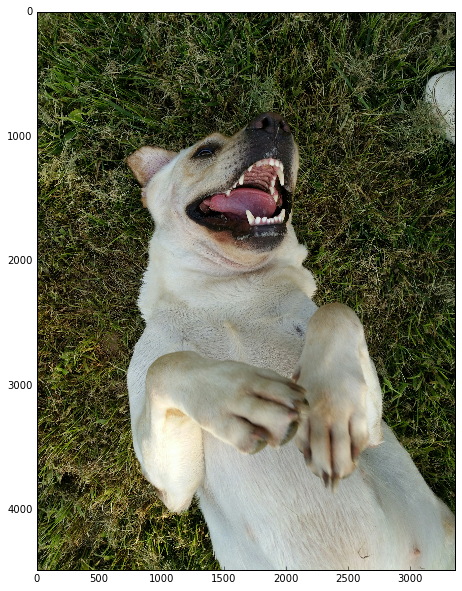

predicted class is: 拉布拉多


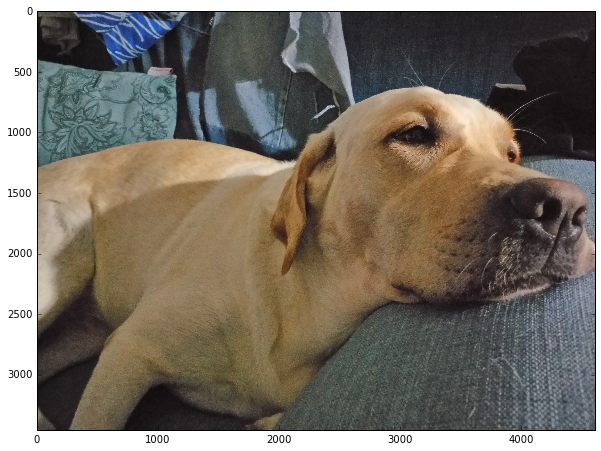

predicted class is: 拉布拉多


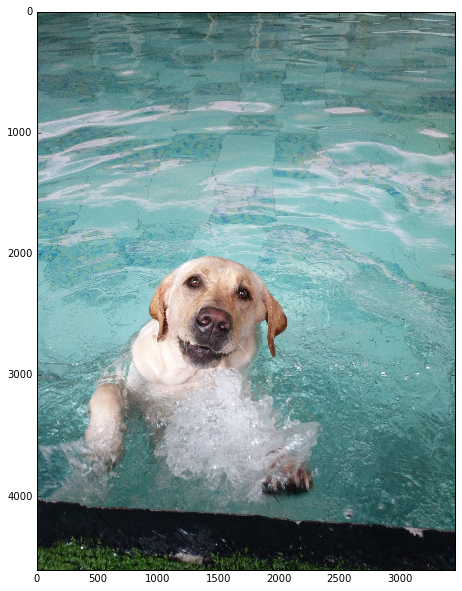

predicted class is: 拉布拉多


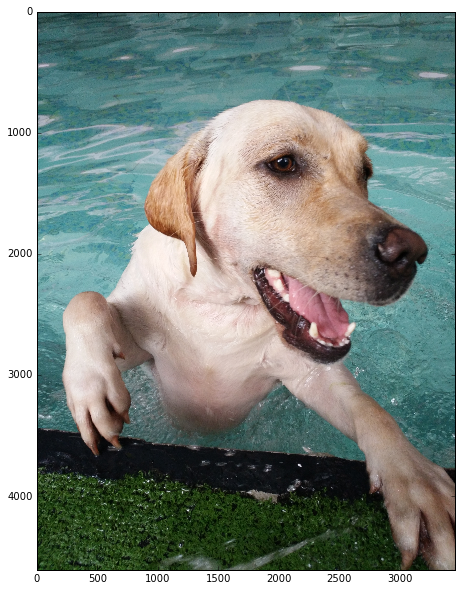

predicted class is: 拉布拉多


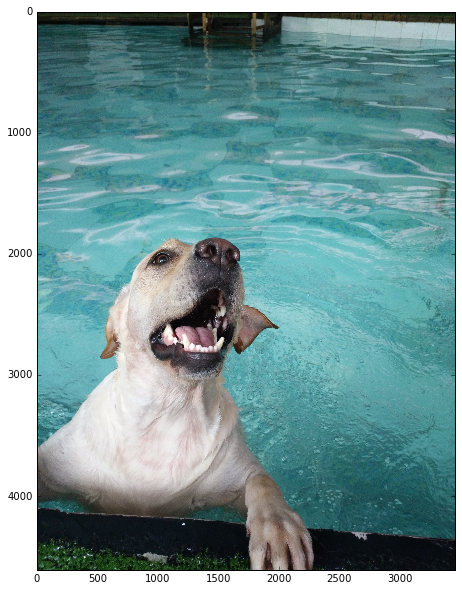

predicted class is: 拉布拉多


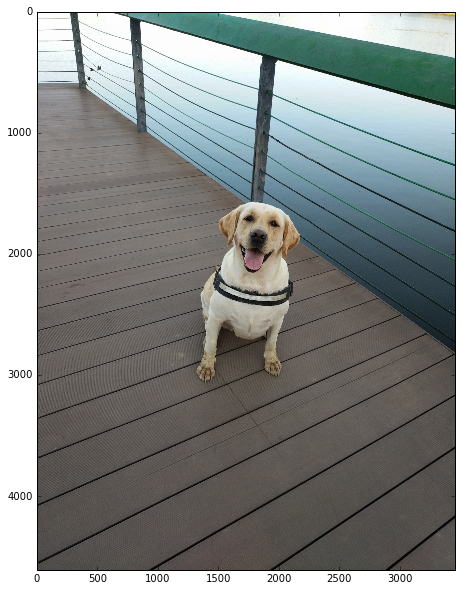

predicted class is: 杜宾


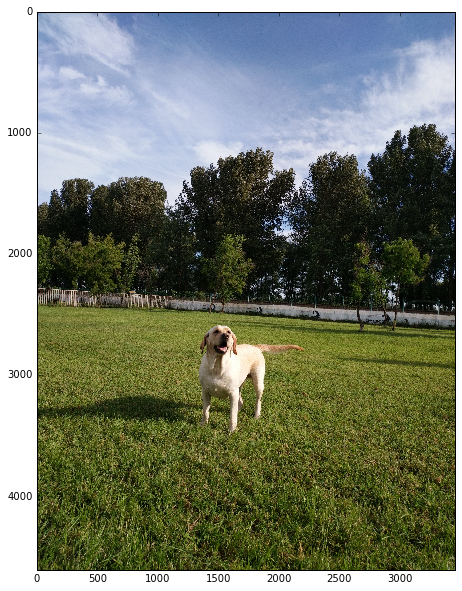

predicted class is: 拉布拉多


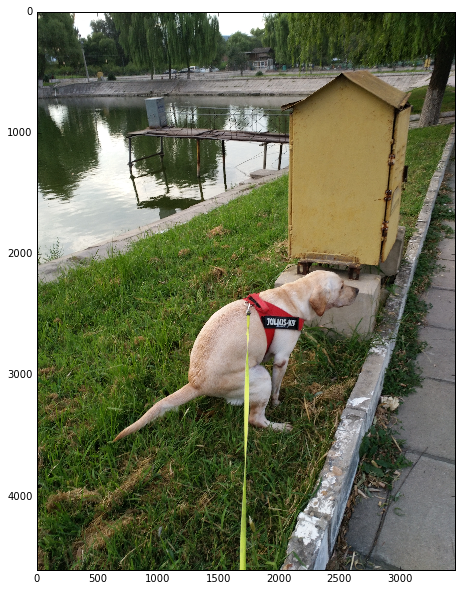

predicted class is: 拉布拉多


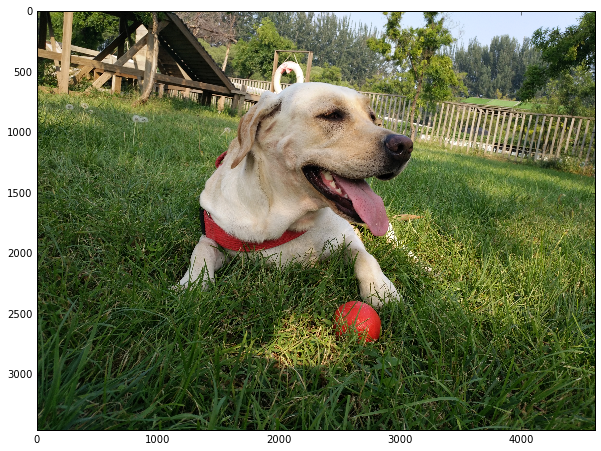

predicted class is: 拉布拉多


In [129]:
error_prob = []
for img in img_list:
    image = caffe.io.load_image(img)
    transformed_image = transformer.preprocess('data', image)
    plt.imshow(image)
    plt.show()
    net.blobs['data'].data[...] = transformed_image
    output = net.forward()
    output_prob = output['prob'][0]
    print 'predicted class is:', class_map[class_map['class'] == output_prob.argmax()].name.values[0]
    if output_prob.argmax() <> 2:
        error_prob.append(img)

能到80%的查准率其实出乎我预料，在数据不算多，且质量一般的情况下能达到这种效果不得不说caffe确实牛
有些照片比如阿布拉屎那个，躺着睡觉耳朵都立起来那个都判断对了，我还以为得判断成哈士奇呢

In [131]:
accuary = (len(img_list) - len(error_prob))/float(len(img_list))
accuary

0.8181818181818182

看一遍分错的这几个，感觉错的rank基本符合正态分布，没什么特别挖掘的

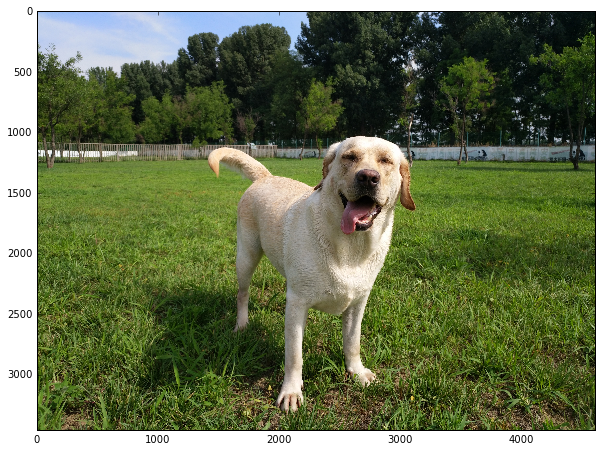

probabilities rank 1 label is 德国牧羊犬
probabilities rank 2 label is 杜宾
probabilities rank 3 label is 拉布拉多
probabilities rank 4 label is 柴犬
probabilities rank 5 label is 博美
probabilities rank 6 label is 哈士奇


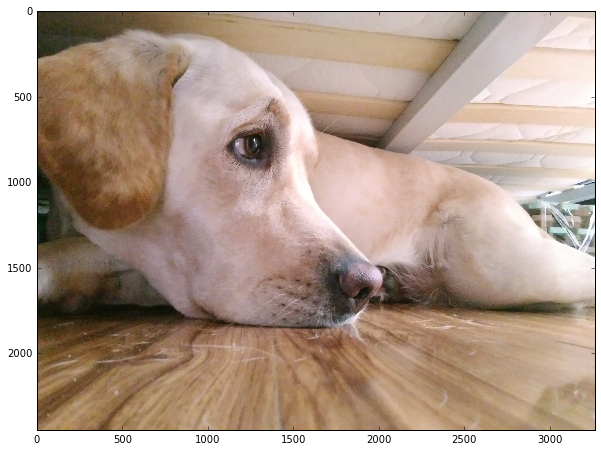

probabilities rank 1 label is 博美
probabilities rank 2 label is 柴犬
probabilities rank 3 label is 拉布拉多
probabilities rank 4 label is 哈士奇
probabilities rank 5 label is 杜宾
probabilities rank 6 label is 德国牧羊犬


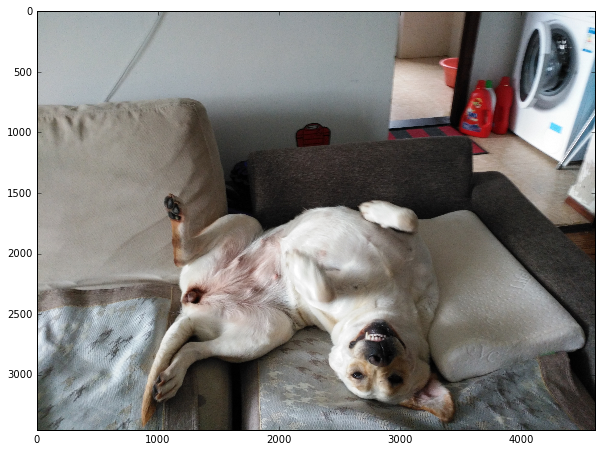

probabilities rank 1 label is 杜宾
probabilities rank 2 label is 德国牧羊犬
probabilities rank 3 label is 柴犬
probabilities rank 4 label is 哈士奇
probabilities rank 5 label is 拉布拉多
probabilities rank 6 label is 博美


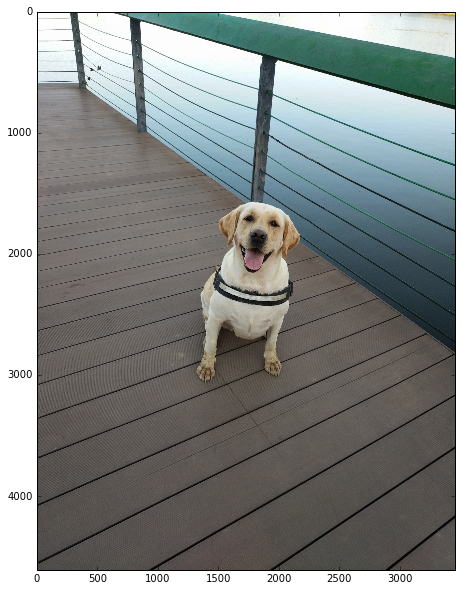

probabilities rank 1 label is 杜宾
probabilities rank 2 label is 拉布拉多
probabilities rank 3 label is 德国牧羊犬
probabilities rank 4 label is 柴犬
probabilities rank 5 label is 博美
probabilities rank 6 label is 哈士奇


In [132]:
for img in error_prob:
    try:
        image = caffe.io.load_image(img)
    except Exception:
        continue
    transformed_image = transformer.preprocess('data', image)
    plt.imshow(image)
    plt.show()
    net.blobs['data'].data[...] = transformed_image
    output = net.forward()
    output_prob = output['prob'][0]
    top_inds = output_prob.argsort()[::-1][:6] 
    for rank, ind in enumerate(top_inds, 1):
        print 'probabilities rank {} label is {}'.format(rank, class_map[class_map['class'] == ind].name.values[0])

就写到这里吧，还拿阿布玩的照片分了两类一类是在草地玩， 一类是在水里玩，训练了模型后测试发现准确率
也相当高，说明**针对小数据集，caffe确实也可以工作的不错**

## 感谢🙏您能有耐心看到这里
## 如果有什么问题可以加阿布的微信 
## 微信号：aaaabbbuu